# Reward Function Based on P3D ResNet and Leeds Data Set
Author : kaykanloo@gmail.com <br>
P3D ResNet: https://github.com/ZhaofanQiu/pseudo-3d-residual-networks

## Imports

### Caffe

In [1]:
import sys
sys.path.insert(0, '/opt/caffe/python')
import caffe

### Custom

In [18]:
# Custom scripts
import lscript as lsp
from DataSet.DataSet import DataSet
import dataset as dset

In [22]:
clear lsp

In [23]:
import lscript as lsp

In [3]:
import random
import numpy as np
from PIL import Image
import os
from os import listdir
from scipy.ndimage import imread

### Parameters

In [4]:
time_step=40
height=160 
width=160 
channel=3
nb_class=3
imagefolderpath= ('../P3DResNet/Data/') # Folder pathe where the video sequences are stored
print(os.path.isdir(imagefolderpath))
cluster_length=16
strides=1
total_frames_in_seq=40
num_clusters= int( (total_frames_in_seq-cluster_length) / strides) + 1
feature_size=2048


True


## Loading Leeds Dataset

In [5]:
ds=DataSet(nb_class,time_step, height, width, channel,imagefolderpath,'diff')

('Loading ', '../P3DResNet/Data/hit/0/0rgb.png')
('Loading ', '../P3DResNet/Data/hit/0/1rgb.png')
('Loading ', '../P3DResNet/Data/hit/0/2rgb.png')
('Loading ', '../P3DResNet/Data/hit/0/3rgb.png')
('Loading ', '../P3DResNet/Data/hit/0/4rgb.png')
('Loading ', '../P3DResNet/Data/hit/0/5rgb.png')
('Loading ', '../P3DResNet/Data/hit/0/6rgb.png')
('Loading ', '../P3DResNet/Data/hit/0/7rgb.png')
('Loading ', '../P3DResNet/Data/hit/0/8rgb.png')
('Loading ', '../P3DResNet/Data/hit/0/9rgb.png')
('Loading ', '../P3DResNet/Data/hit/0/10rgb.png')
('Loading ', '../P3DResNet/Data/hit/0/11rgb.png')
('Loading ', '../P3DResNet/Data/hit/0/12rgb.png')
('Loading ', '../P3DResNet/Data/hit/0/13rgb.png')
('Loading ', '../P3DResNet/Data/hit/0/14rgb.png')
('Loading ', '../P3DResNet/Data/hit/0/15rgb.png')
('Loading ', '../P3DResNet/Data/hit/0/16rgb.png')
('Loading ', '../P3DResNet/Data/hit/0/17rgb.png')
('Loading ', '../P3DResNet/Data/hit/0/18rgb.png')
('Loading ', '../P3DResNet/Data/hit/0/19rgb.png')
('Loading 

('Loading ', '../P3DResNet/Data/hit/4/13rgb.png')
('Loading ', '../P3DResNet/Data/hit/4/14rgb.png')
('Loading ', '../P3DResNet/Data/hit/4/15rgb.png')
('Loading ', '../P3DResNet/Data/hit/4/16rgb.png')
('Loading ', '../P3DResNet/Data/hit/4/17rgb.png')
('Loading ', '../P3DResNet/Data/hit/4/18rgb.png')
('Loading ', '../P3DResNet/Data/hit/4/19rgb.png')
('Loading ', '../P3DResNet/Data/hit/4/20rgb.png')
('Loading ', '../P3DResNet/Data/hit/4/21rgb.png')
('Loading ', '../P3DResNet/Data/hit/4/22rgb.png')
('Loading ', '../P3DResNet/Data/hit/4/23rgb.png')
('Loading ', '../P3DResNet/Data/hit/4/24rgb.png')
('Loading ', '../P3DResNet/Data/hit/4/25rgb.png')
('Loading ', '../P3DResNet/Data/hit/4/26rgb.png')
('Loading ', '../P3DResNet/Data/hit/4/27rgb.png')
('Loading ', '../P3DResNet/Data/hit/4/28rgb.png')
('Loading ', '../P3DResNet/Data/hit/4/29rgb.png')
('Loading ', '../P3DResNet/Data/hit/4/30rgb.png')
('Loading ', '../P3DResNet/Data/hit/4/31rgb.png')
('Loading ', '../P3DResNet/Data/hit/4/32rgb.png')


('Loading ', '../P3DResNet/Data/push/3/20rgb.png')
('Loading ', '../P3DResNet/Data/push/3/21rgb.png')
('Loading ', '../P3DResNet/Data/push/3/22rgb.png')
('Loading ', '../P3DResNet/Data/push/3/23rgb.png')
('Loading ', '../P3DResNet/Data/push/3/24rgb.png')
('Loading ', '../P3DResNet/Data/push/3/25rgb.png')
('Loading ', '../P3DResNet/Data/push/3/26rgb.png')
('Loading ', '../P3DResNet/Data/push/3/27rgb.png')
('Loading ', '../P3DResNet/Data/push/3/28rgb.png')
('Loading ', '../P3DResNet/Data/push/3/29rgb.png')
('Loading ', '../P3DResNet/Data/push/3/30rgb.png')
('Loading ', '../P3DResNet/Data/push/3/31rgb.png')
('Loading ', '../P3DResNet/Data/push/3/32rgb.png')
('Loading ', '../P3DResNet/Data/push/3/33rgb.png')
('Loading ', '../P3DResNet/Data/push/3/34rgb.png')
('Loading ', '../P3DResNet/Data/push/3/35rgb.png')
('Loading ', '../P3DResNet/Data/push/3/36rgb.png')
('Loading ', '../P3DResNet/Data/push/3/37rgb.png')
('Loading ', '../P3DResNet/Data/push/3/38rgb.png')
('Loading ', '../P3DResNet/Data

('Loading ', '../P3DResNet/Data/reach/2/31rgb.png')
('Loading ', '../P3DResNet/Data/reach/2/32rgb.png')
('Loading ', '../P3DResNet/Data/reach/2/33rgb.png')
('Loading ', '../P3DResNet/Data/reach/2/34rgb.png')
('Loading ', '../P3DResNet/Data/reach/2/35rgb.png')
('Loading ', '../P3DResNet/Data/reach/2/36rgb.png')
('Loading ', '../P3DResNet/Data/reach/2/37rgb.png')
('Loading ', '../P3DResNet/Data/reach/2/38rgb.png')
('Loading ', '../P3DResNet/Data/reach/2/39rgb.png')
('Loading ', '../P3DResNet/Data/reach/3/0rgb.png')
('Loading ', '../P3DResNet/Data/reach/3/1rgb.png')
('Loading ', '../P3DResNet/Data/reach/3/2rgb.png')
('Loading ', '../P3DResNet/Data/reach/3/3rgb.png')
('Loading ', '../P3DResNet/Data/reach/3/4rgb.png')
('Loading ', '../P3DResNet/Data/reach/3/5rgb.png')
('Loading ', '../P3DResNet/Data/reach/3/6rgb.png')
('Loading ', '../P3DResNet/Data/reach/3/7rgb.png')
('Loading ', '../P3DResNet/Data/reach/3/8rgb.png')
('Loading ', '../P3DResNet/Data/reach/3/9rgb.png')
('Loading ', '../P3DRe

## Loading model

In [6]:
model = caffe.Net('../P3DResNet/deploy_p3d_resnet_sports1m.prototxt', '../P3DResNet/p3d_resnet_sports1m_iter_150000.caffemodel', caffe.TEST)

## Extracting features

In [7]:
vids, labels = ds.get_batch(1)
print(vids.shape)
print(labels)

(1, 40, 160, 160, 3)
['hit']


label:1000.0
('Video_seq shape:', (1, 40, 160, 160, 3), 'Label shape', (1,))


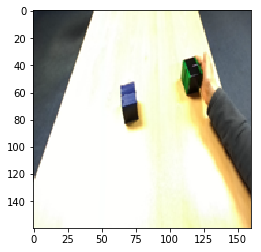

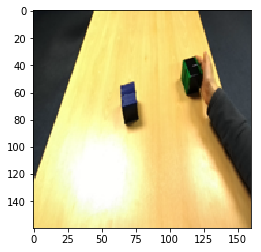

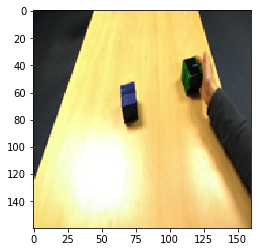

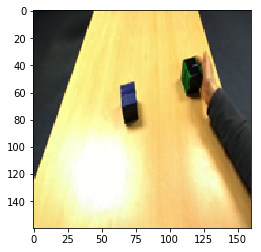

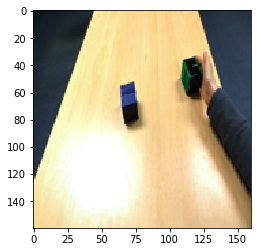

...

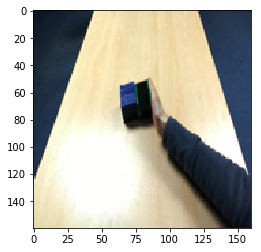

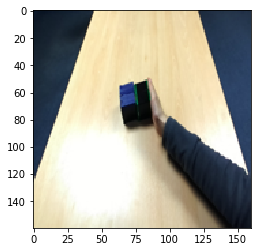

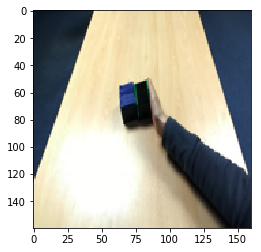

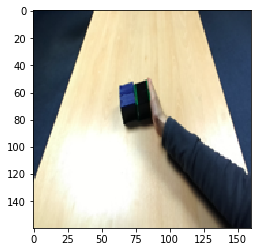

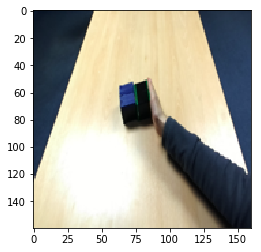

In [25]:
y_=np.empty([1])
lsp.view_video_seq(vids,y_,40,0)

In [8]:
## Splitting into clusters the video of source demonstration
x_demo,_ =ds.get_batch(1)
x_demo_original=x_demo
x_demo =x_demo.reshape(x_demo.shape[0],x_demo.shape[1],height,width,channel)
clusters_demo=dset.clusters_with_strides(x_demo,num_clusters,cluster_length,height,width,channel,strides)

(25, 16, 160, 160, 3)


In [9]:
batches = np.moveaxis(clusters_demo, 4, 1)

In [10]:
batches[0].shape

(3, 16, 160, 160)

In [11]:
test = np.expand_dims(batches[0], axis=0)
test.shape

(1, 3, 16, 160, 160)

In [12]:
model.blobs['data'].data[...] = test

In [13]:
model.forward()

{'prob': array([[  9.32118914e-04,   2.59547651e-05,   5.45127958e-04,
           4.61552059e-04,   1.20751932e-03,   1.56029481e-02,
           3.54035437e-04,   1.06372470e-02,   3.16621037e-04,
           8.67210692e-05,   3.76291410e-03,   1.13612034e-04,
           9.62244667e-05,   4.13611066e-04,   2.03809308e-04,
           6.78212789e-04,   1.28041569e-03,   7.65851801e-05,
           1.39322219e-04,   1.57261849e-04,   7.02704117e-03,
           1.07442524e-04,   2.71887169e-04,   1.47044731e-04,
           2.22792309e-02,   6.72822236e-04,   4.42168639e-05,
           3.24004468e-05,   8.45123490e-04,   6.90245797e-05,
           1.33765017e-04,   5.79652609e-04,   1.25781226e-04,
           9.18095408e-04,   4.29335691e-04,   4.34221329e-05,
           4.42370037e-05,   1.89179380e-04,   4.83151416e-05,
           7.07883883e-05,   6.31130979e-06,   1.00701145e-05,
           3.01310902e-05,   1.29863884e-05,   1.29632448e-04,
           1.58346468e-03,   1.62975703e-04,   

In [14]:
pool5 = model.blobs['pool5'].data

In [15]:
pool5 = pool5.reshape((2048))

In [17]:
t=clusters_demo[0].reshape(1,channel,cluster_length,height,width)

In [18]:
t.shape

(1, 3, 16, 160, 160)

In [19]:
model.blobs['data'].data[...] = t

In [20]:
model.forward()

{'prob': array([[  7.61526972e-02,   1.86252772e-04,   8.19781097e-04,
           4.54414607e-04,   1.84776646e-03,   1.33409037e-03,
           3.47612106e-04,   1.79993757e-03,   6.91777386e-04,
           3.87353357e-04,   1.05131161e-03,   5.84245543e-04,
           7.24419835e-04,   2.92988640e-04,   6.97948562e-04,
           4.00681922e-04,   4.84247808e-04,   9.18513222e-04,
           1.70400250e-03,   3.44467792e-03,   3.43399006e-04,
           4.16895462e-04,   5.06629935e-04,   2.26791773e-04,
           4.50376188e-04,   3.42766551e-04,   3.38937039e-04,
           5.27415832e-04,   1.93682587e-04,   1.77825612e-04,
           1.64702346e-04,   1.05320614e-04,   1.14125702e-04,
           1.14616967e-04,   1.41442113e-04,   1.40586752e-04,
           9.38408994e-05,   1.91587009e-04,   1.78437505e-04,
           1.08910201e-04,   2.21884795e-04,   1.49342799e-04,
           2.36613239e-04,   1.28572457e-04,   1.88908991e-04,
           1.64992083e-03,   5.76504273e-04,   

In [9]:
## Extraction of features
print('shape of clustered demo data:',clusters_demo.shape)
features_demo=np.zeros([num_clusters,feature_size])
for i in range(num_clusters):
    t=clusters_demo[i].reshape(1,channel,cluster_length,height,width)
    model.blobs['data'].data[...] = t
    model.forward()
    pool5 = model.blobs['pool5'].data
    features_demo[i]= pool5.reshape((2048))
    #print(features)
print('shape of features from robot actions: ',features_demo.shape)

('shape of clustered demo data:', (25, 16, 160, 160, 3))
('shape of features from robot actions: ', (25, 2048))


In [10]:
## Splitting into & displaying clusters of target actions
x_robo,_=ds.get_batch(1)
x_robo_original=x_robo
x_robo =x_robo.reshape(x_robo.shape[0],x_robo.shape[1],height,width,channel)
clusters_robo=dset.clusters_with_strides(x_robo,num_clusters,cluster_length,height,width,channel,strides)

## Extracting features
print('shape of clustered robot data:',clusters_robo.shape)
features_robo=np.zeros([num_clusters,feature_size])
for i in range(num_clusters):
    t=clusters_robo[i].reshape(1,channel,cluster_length,height,width)
    model.blobs['data'].data[...] = t
    model.forward()
    pool5 = model.blobs['pool5'].data
    features_robo[i]= pool5.reshape((2048))
    #print(features)
print('shape of features from robot actions: ', features_robo.shape)

(25, 16, 160, 160, 3)
('shape of clustered robot data:', (25, 16, 160, 160, 3))
('shape of features from robot actions: ', (25, 2048))


In [11]:
features_demo

array([[  0.00000000e+00,   0.00000000e+00,   3.22694921e+00, ...,
          0.00000000e+00,   0.00000000e+00,   0.00000000e+00],
       [  0.00000000e+00,   0.00000000e+00,   3.37432647e+00, ...,
          3.93939484e-03,   0.00000000e+00,   0.00000000e+00],
       [  0.00000000e+00,   0.00000000e+00,   3.37728310e+00, ...,
          4.06760946e-02,   0.00000000e+00,   0.00000000e+00],
       ..., 
       [  0.00000000e+00,   0.00000000e+00,   4.48732948e+00, ...,
          0.00000000e+00,   0.00000000e+00,   0.00000000e+00],
       [  0.00000000e+00,   0.00000000e+00,   4.45030975e+00, ...,
          0.00000000e+00,   0.00000000e+00,   0.00000000e+00],
       [  0.00000000e+00,   0.00000000e+00,   4.30053043e+00, ...,
          0.00000000e+00,   0.00000000e+00,   0.00000000e+00]])

In [12]:
features_robo

array([[ 0.        ,  0.        ,  4.53075027, ...,  0.03330479,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  4.6847105 , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  4.91013765, ...,  0.        ,
         0.        ,  0.        ],
       ..., 
       [ 0.        ,  0.        ,  4.03308582, ...,  0.04385774,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  4.00340462, ...,  0.05574204,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  4.02419138, ...,  0.06023672,
         0.        ,  0.        ]])

#### Extracting reward function

In [25]:
import matplotlib.pyplot as plt

In [26]:
%matplotlib inline

In [13]:
distance=np.ones([num_clusters,feature_size])
reward=np.ones([num_clusters,1])
for i in range(num_clusters):
    distance[i] = features_demo[i]-features_robo[i]
    reward[i]=-(np.linalg.norm(distance[i]))
#print(reward)
#print(dist)

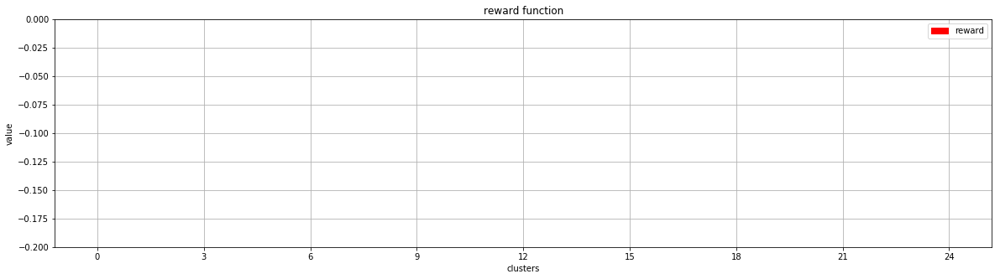

In [24]:
y_vlaues=list((range(num_clusters)))
lsp.plot_values_with_legends(y_vlaues,reward,'reward','clusters','value','reward function',color='red',ylim=True)

In [17]:
reward

array([[-10.69590662],
       [-10.44200584],
       [-10.67670711],
       [-10.16491014],
       [ -9.60647785],
       [ -9.00326937],
       [ -8.72153311],
       [ -7.83483907],
       [ -6.80979596],
       [ -5.95136063],
       [ -5.15637886],
       [ -4.71834236],
       [ -4.73401485],
       [ -4.45872993],
       [ -4.28462309],
       [ -4.76757076],
       [ -5.49032939],
       [ -6.19183309],
       [ -7.0252796 ],
       [ -7.31298117],
       [ -7.51546465],
       [ -7.35802095],
       [ -7.86742261],
       [ -8.45430345],
       [ -8.68435704]])

In [27]:
plt.figure()

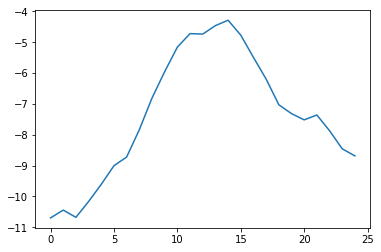

In [28]:
plt.plot(reward)

In [22]:
res5pool = model.blobs['res5a_pool'].data

In [24]:
res5pool.shape

(1, 1024, 1, 10, 10)

#### Displaying cluster

('cluster no: ', 0)


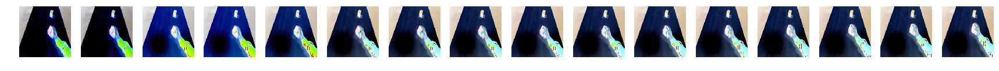

('cluster no: ', 1)


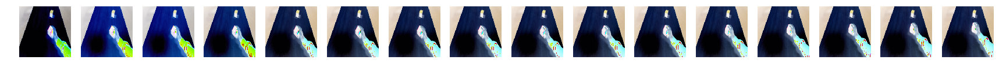

('cluster no: ', 2)


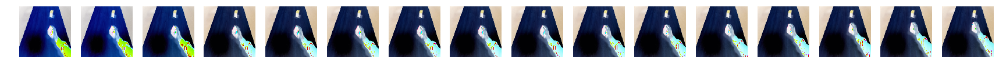

('cluster no: ', 3)


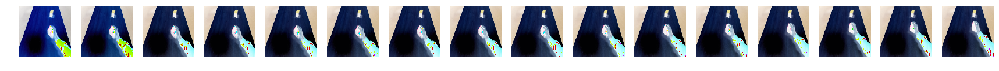

('cluster no: ', 4)


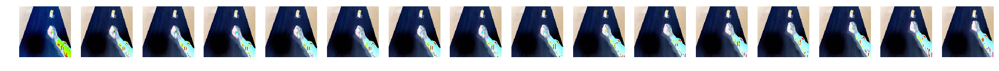

('cluster no: ', 5)


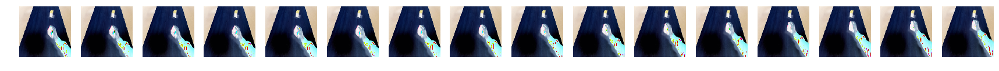

('cluster no: ', 6)


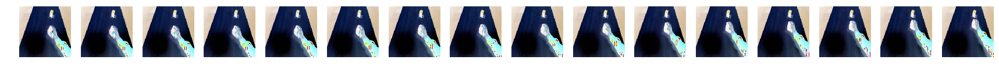

('cluster no: ', 7)


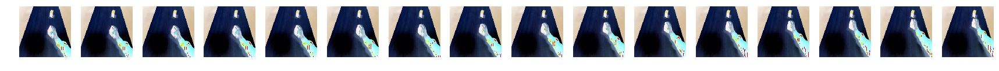

('cluster no: ', 8)


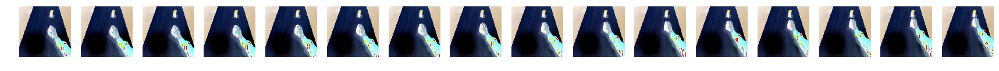

('cluster no: ', 9)


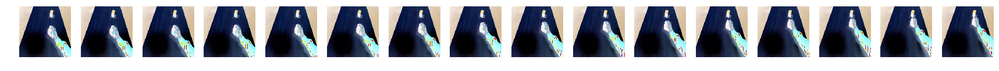

('cluster no: ', 10)


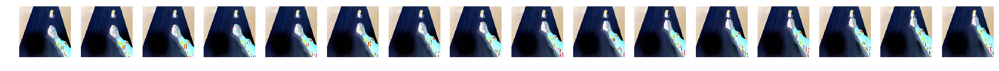

('cluster no: ', 11)


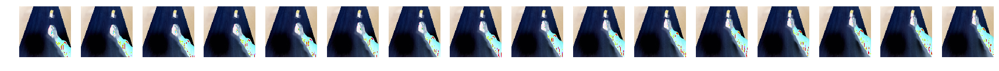

('cluster no: ', 12)


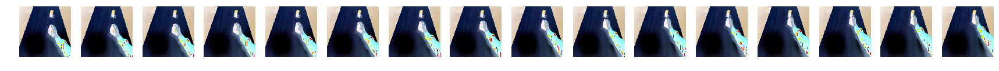

('cluster no: ', 13)


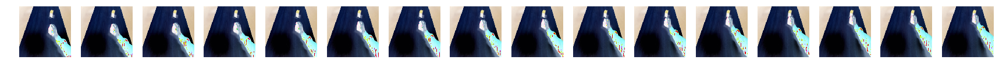

('cluster no: ', 14)


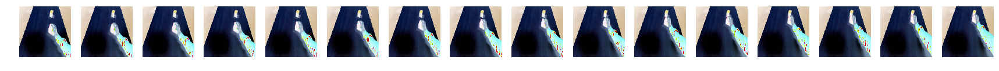

('cluster no: ', 15)


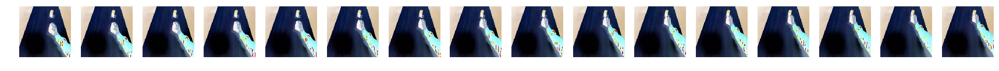

('cluster no: ', 16)


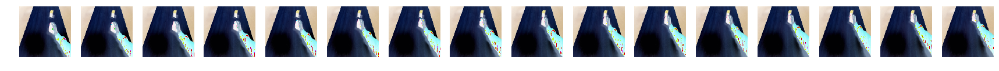

('cluster no: ', 17)


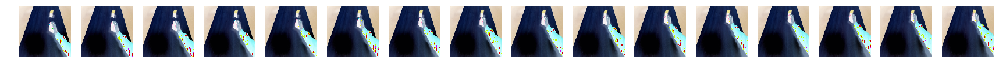

('cluster no: ', 18)


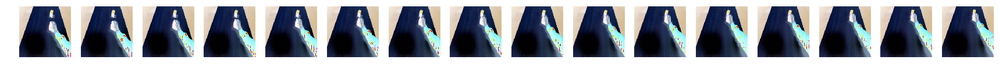

('cluster no: ', 19)


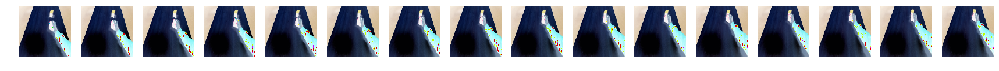

('cluster no: ', 20)


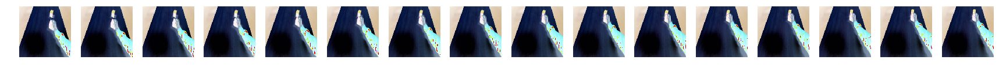

('cluster no: ', 21)


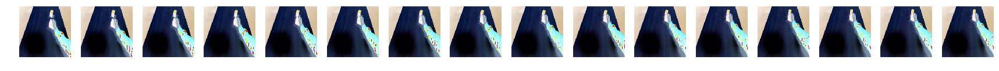

('cluster no: ', 22)


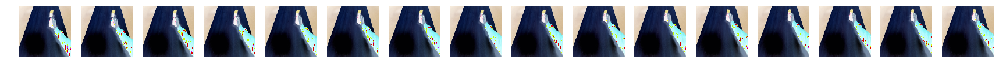

('cluster no: ', 23)


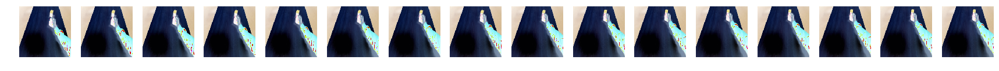

('cluster no: ', 24)


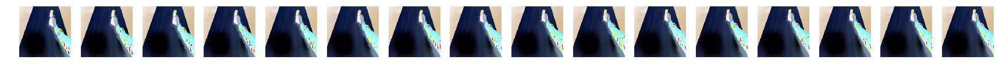

In [31]:
## Clusters from demos
for i in range(num_clusters):
    cluster_id=i
    y_d=np.repeat(y_,num_clusters)
    print('cluster no: ',i)
    display=clusters_demo.reshape(clusters_demo.shape[0],clusters_demo.shape[1],clusters_demo.shape[2],clusters_demo.shape[3],clusters_demo.shape[4])
    lsp.view_video_inline(display,y_d,cluster_length,cluster_id)

('cluster no: ', 0)


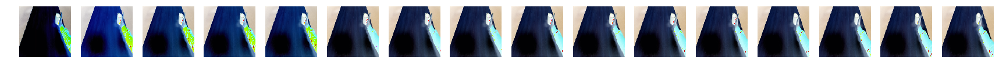

('cluster no: ', 1)


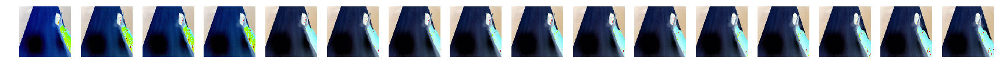

('cluster no: ', 2)


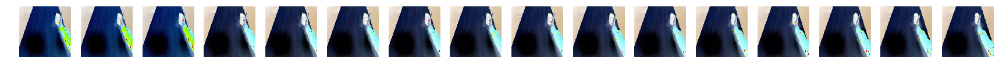

('cluster no: ', 3)


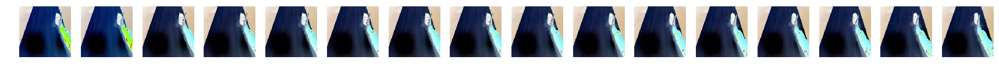

('cluster no: ', 4)


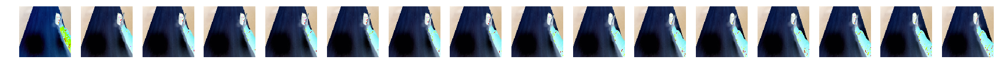

('cluster no: ', 5)


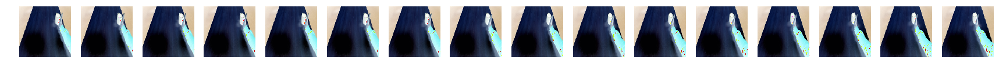

('cluster no: ', 6)


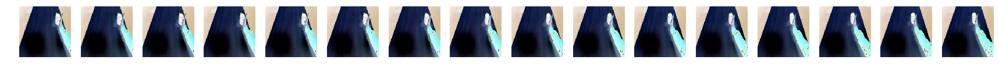

('cluster no: ', 7)


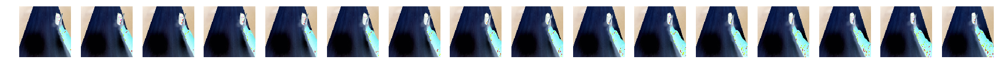

('cluster no: ', 8)


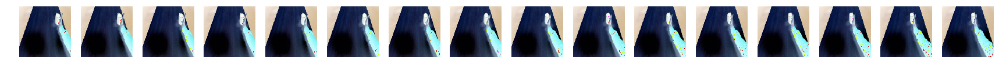

('cluster no: ', 9)


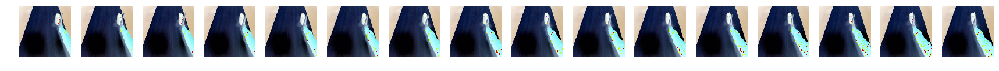

('cluster no: ', 10)


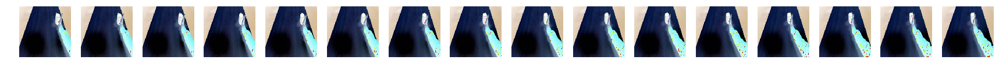

('cluster no: ', 11)


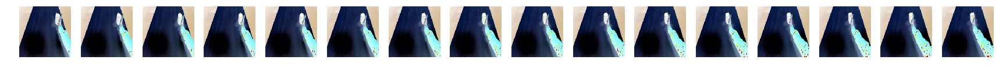

('cluster no: ', 12)


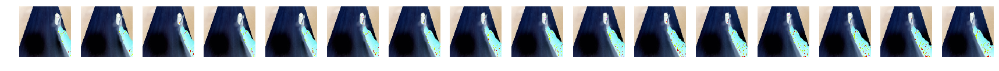

('cluster no: ', 13)


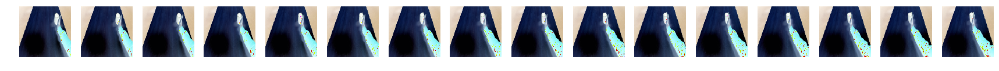

('cluster no: ', 14)


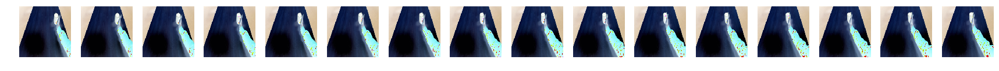

('cluster no: ', 15)


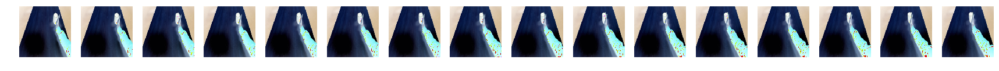

('cluster no: ', 16)


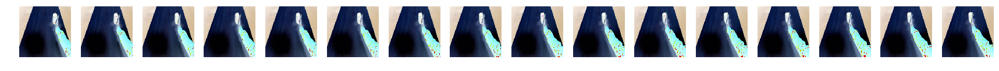

('cluster no: ', 17)


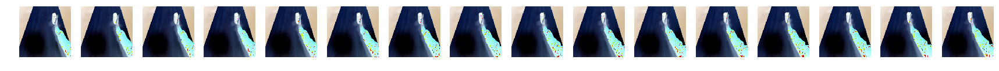

('cluster no: ', 18)


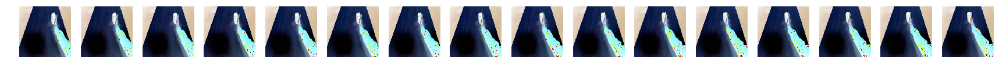

('cluster no: ', 19)


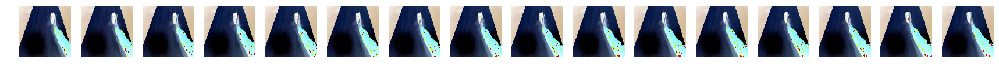

('cluster no: ', 20)


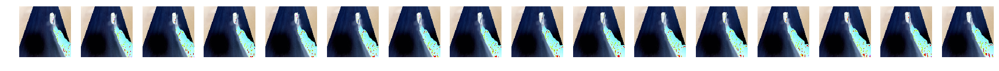

('cluster no: ', 21)


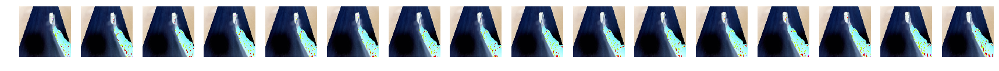

('cluster no: ', 22)


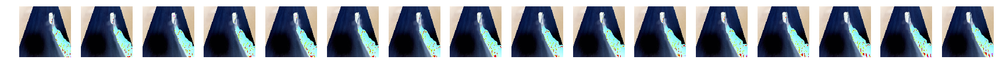

('cluster no: ', 23)


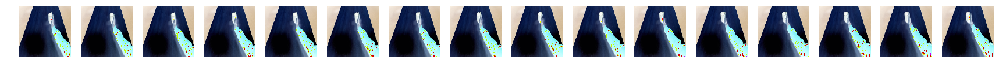

('cluster no: ', 24)


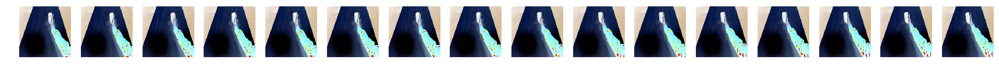

In [32]:
## Clusters from robot action
y_r=np.repeat(y_,num_clusters)
for i in range(num_clusters):
    cluster_id=i 
    print('cluster no: ',i)
    display=clusters_robo.reshape(clusters_robo.shape[0],clusters_robo.shape[1],clusters_robo.shape[2],clusters_robo.shape[3],clusters_robo.shape[4])
    lsp.view_video_inline(display,y_r,cluster_length,cluster_id)

#### Displaying full video sequences

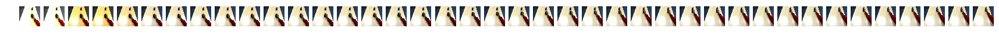

label:0.0
('Video_seq shape:', (1, 40, 160, 160, 3), 'Label shape', (1,))


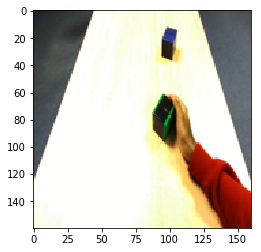

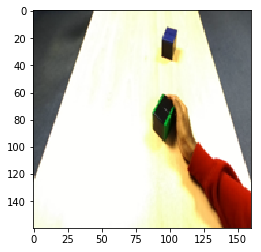

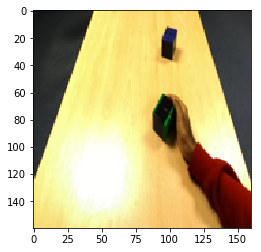

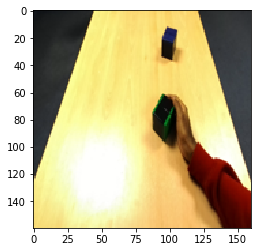

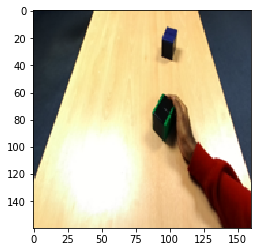

...

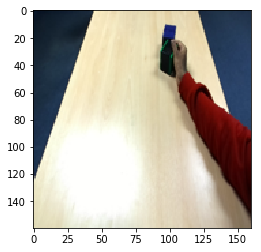

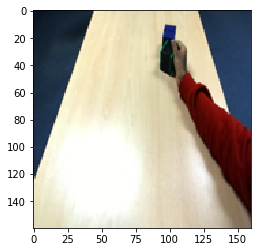

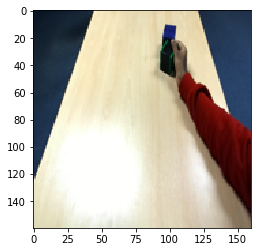

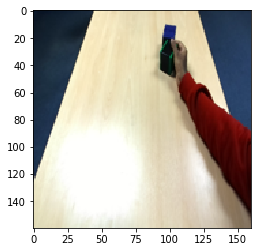

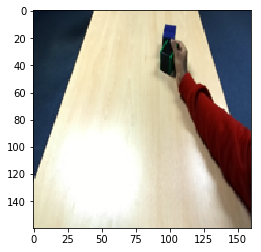

In [29]:
## Demo / Source video
y_=np.zeros([1])
lsp.view_video_inline(x_demo_original,y_,time_step,0)
lsp.view_video_seq(x_demo_original,y_,time_step,0)

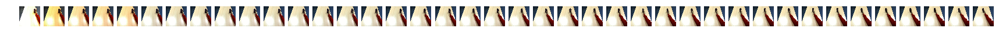

label:0.0
('Video_seq shape:', (1, 40, 160, 160, 3), 'Label shape', (1,))


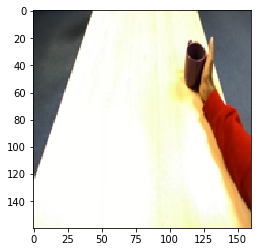

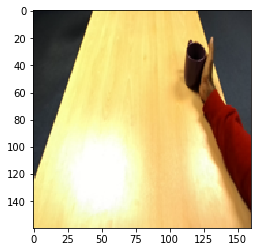

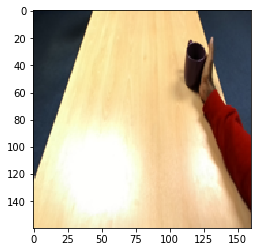

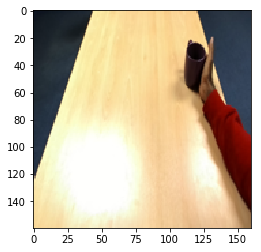

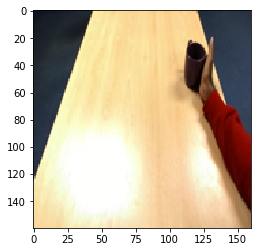

...

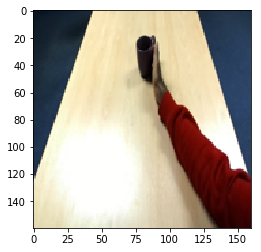

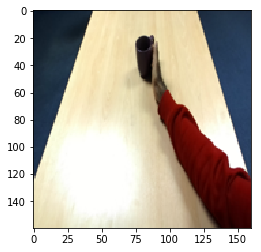

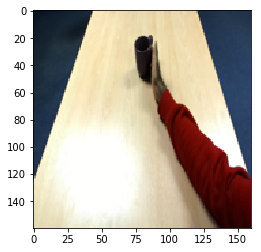

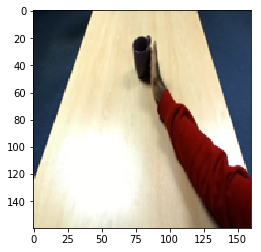

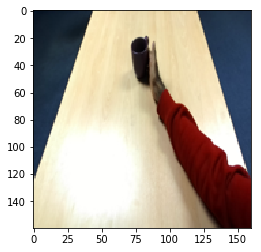

In [30]:
### Target / robot video
y_=np.zeros([1])
lsp.view_video_inline(x_robo_original,y_,time_step,0)
lsp.view_video_seq(x_robo_original,y_,time_step,0)